In [1]:
import os
import pickle
import pwd
import warnings

import numpy as np
import pandas as pd
from scipy.stats import norm

from anndata import read_h5ad
import palantir
import scanpy as sc

import mellon

from IPython.display import display, Markdown

In [2]:
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline
matplotlib.rcParams["image.cmap"] = "Spectral_r"  # preferred color map
# no bounding boxes or axis:
matplotlib.rcParams["axes.spines.bottom"] = "off"
matplotlib.rcParams["axes.spines.top"] = "off"
matplotlib.rcParams["axes.spines.left"] = "off"
matplotlib.rcParams["axes.spines.right"] = "off"
# use Arial
matplotlib.rcParams["font.sans-serif"] = ["Arial"]
matplotlib.rcParams["font.family"] = "sans-serif"

# Preprocessing

In [3]:
annData_tcell = "../data/preprocessed_t-cell-depleted-bm.h5ad"
annData_cd34 = "../data/cd34_multiome_rna_no_bcells.h5ad"

In [4]:
ad_cd34 = read_h5ad(annData_cd34)
ad_tcell = read_h5ad(annData_tcell)

## Cell Type Annotation

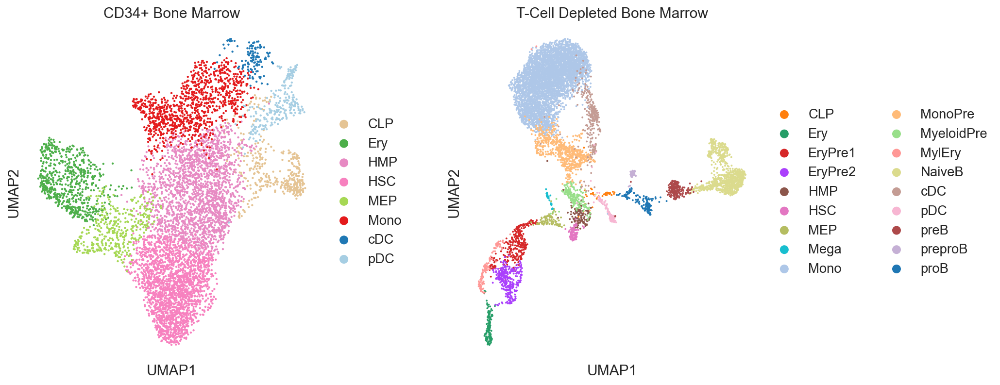

In [6]:
fig, ax = plt.subplots(
    1, 2, facecolor="none", figsize=(13, 6), dpi=150, gridspec_kw={"wspace": 0.5}
)
sc.pl.scatter(ad_cd34, basis="umap", color=["celltype"], ax=ax[0], show=False)
ax[0].title.set_text("CD34+ Bone Marrow")
sc.pl.scatter(ad_tcell, basis="umap", color=["celltype"], ax=ax[1], show=False)
ax[1].title.set_text("T-Cell Depleted Bone Marrow")
plt.show()

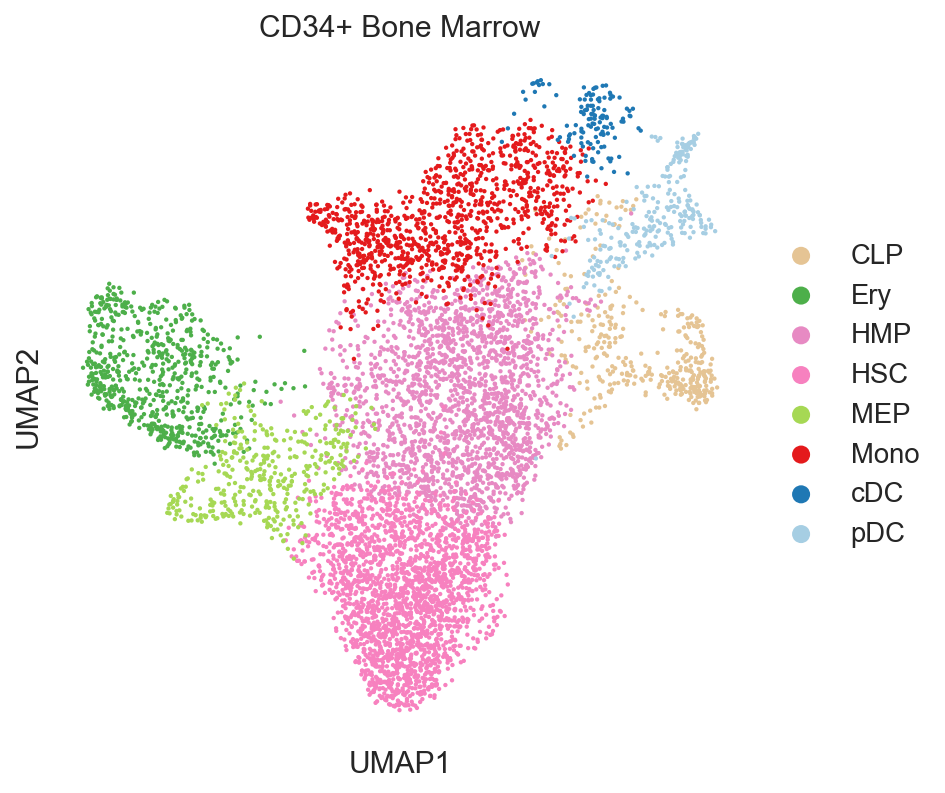

In [7]:
fig, ax = plt.subplots(
    1, 1, facecolor="none", figsize=(6, 6), dpi=150, gridspec_kw={"wspace": 0.5}
)
sc.pl.scatter(ad_cd34, basis="umap", color=["celltype"], ax=ax, show=False)
ax.title.set_text("CD34+ Bone Marrow")
plt.show()

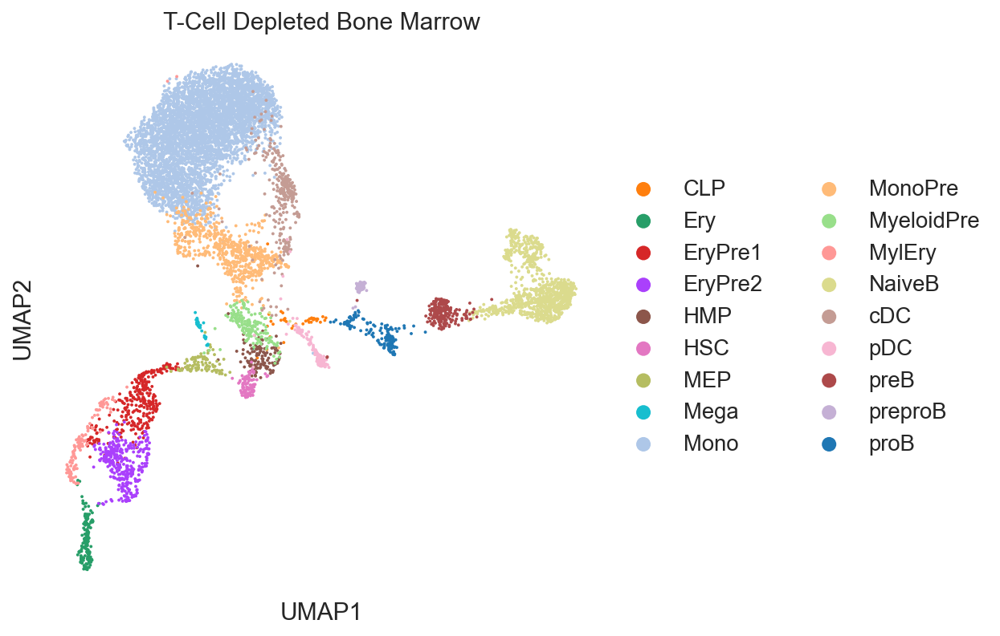

In [8]:
fig, ax = plt.subplots(
    1, 1, facecolor="none", figsize=(6, 6), dpi=150, gridspec_kw={"wspace": 0.5}
)
sc.pl.scatter(ad_tcell, basis="umap", color=["celltype"], ax=ax, show=False)
ax.title.set_text("T-Cell Depleted Bone Marrow")
plt.show()

## Mellon Density Estimation

In [9]:
est_tcell = mellon.DensityEstimator()
ad_tcell.obs["log_density"] = est_tcell.fit_predict(ad_tcell.obsm["DM_EigenVectors"])
ad_tcell.obs["log_density_quantile"] = (
    ad_tcell.obs["log_density"].rank() / ad_tcell.n_obs
)

est_cd34 = mellon.DensityEstimator()
ad_cd34.obs["log_density"] = est_cd34.fit_predict(ad_cd34.obsm["DM_EigenVectors"])
ad_cd34.obs["log_density_quantile"] = ad_cd34.obs["log_density"].rank() / ad_cd34.n_obs

[2023-06-22 21:13:01,424] [INFO    ] Computing nearest neighbor distances.
[2023-06-22 21:13:02,401] [INFO    ] Using covariance function Matern52(ls=0.006271295878809611).
[2023-06-22 21:13:02,403] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-22 21:13:04,759] [INFO    ] Doing low-rank Cholesky decomposition for 8,627 samples and 5,000 landmarks.
[2023-06-22 21:13:09,469] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-22 21:13:10,506] [INFO    ] Running inference using L-BFGS-B.
[2023-06-22 21:13:24,548] [INFO    ] Computing nearest neighbor distances.
[2023-06-22 21:13:24,723] [INFO    ] Using covariance function Matern52(ls=0.016795660090567287).
[2023-06-22 21:13:24,725] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-22 21:13:27,017] [INFO    ] Doing low-rank Cholesky decomposition for 6,881 samples and 5,000 landmarks.
[2023-06-22 21:13:30,851] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-22 21:13

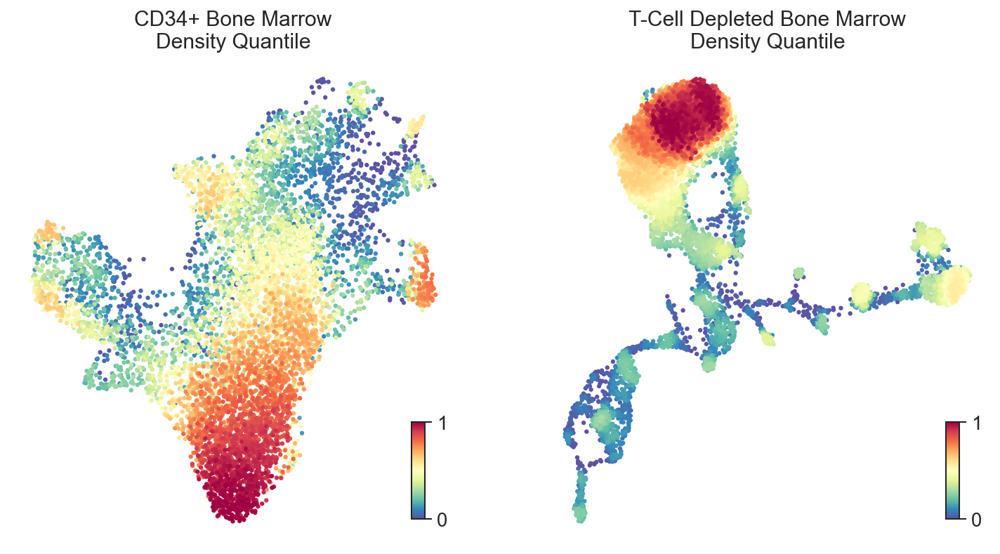

In [10]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
i = np.argsort(ad_cd34.obs["log_density_quantile"])
cb = ax[0].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["log_density_quantile"][i],
    s=5,
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("CD34+ Bone Marrow\nDensity Quantile")
cax = ax[0].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax, ticks=[1e-3, 1])
cbar.ax.set_yticklabels([0, 1])

i = np.argsort(ad_tcell.obs["log_density_quantile"])
cb = ax[1].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["log_density_quantile"][i],
    s=5,
)
ax[1].title.set_text("T-Cell Depleted Bone Marrow\nDensity Quantile")
ax[1].set_xticks([])
ax[1].set_yticks([])
cax = ax[1].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax, ticks=[1e-3, 1])
cbar.ax.set_yticklabels([0, 1])
plt.show()

# Supplementary Figure Temp1

In [11]:
sc.pp.neighbors(
    ad_cd34,
    use_rep="X_pca",
    key_added="pca",
    metric="euclidean",
)
ad_cd34.obs["1/distance"] = [
    1 / ad_cd34.obsp["pca_distances"].getrow(i).data.max() for i in range(ad_cd34.n_obs)
]

sc.pp.neighbors(ad_tcell, use_rep="X_pca", key_added="pca", metric="euclidean")
ad_tcell.obs["1/distance"] = [
    1 / ad_tcell.obsp["pca_distances"].getrow(i).data.max()
    for i in range(ad_tcell.n_obs)
]

/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/fh/fast/setty_m/user/dotto/mamba/envs/mel

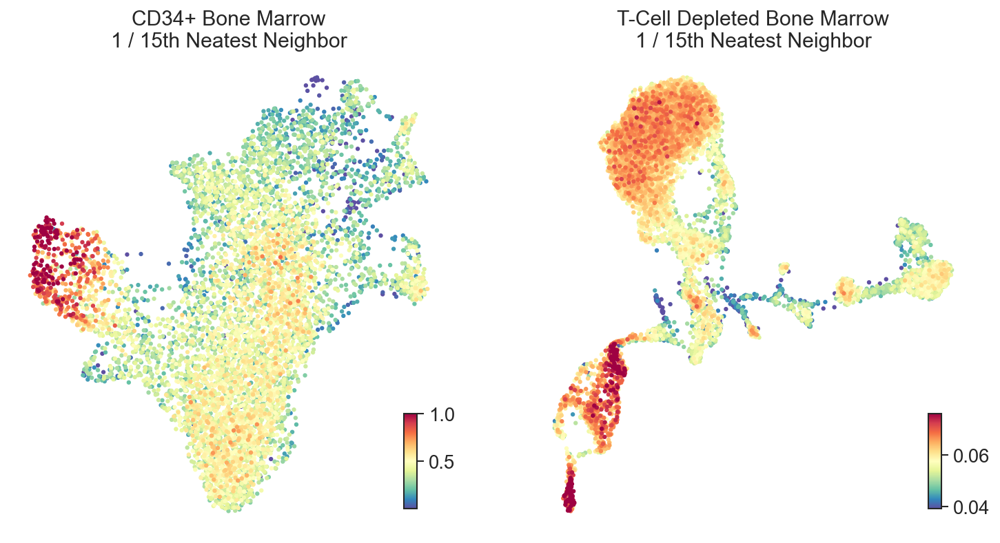

In [12]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
i = np.argsort(ad_cd34.obs["1/distance"])
clims = np.quantile(ad_cd34.obs["1/distance"], [0.01, 0.99])
ax[0].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["1/distance"][i],
    s=5,
    vmin=clims[0],
    vmax=clims[1],
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("CD34+ Bone Marrow\n1 / 15th Neatest Neighbor")
cax = ax[0].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)

i = np.argsort(ad_tcell.obs["1/distance"])
clims = np.quantile(ad_tcell.obs["1/distance"], [0.01, 0.99])
cb = ax[1].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["1/distance"][i],
    s=5,
    vmin=clims[0],
    vmax=clims[1],
)
ax[1].title.set_text("T-Cell Depleted Bone Marrow\n1 / 15th Neatest Neighbor")
ax[1].set_xticks([])
ax[1].set_yticks([])
cax = ax[1].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)
plt.show()

UMAP of the CD34+ Bone Marrow and the T-Cell Depleted Bone Marrow dataset colored by 1 over the distance to the 15th nearest neighbor in PCA space.

## CD34

In [13]:
ad_cd34.obsm["X_original_umap"] = ad_cd34.obsm["X_umap"]
sc.tl.umap(ad_cd34, min_dist=0.1)
ad_cd34.obsm["X_new_umap"] = ad_cd34.obsm["X_umap"]
ad_cd34.obsm["X_umap"] = ad_cd34.obsm["X_original_umap"]

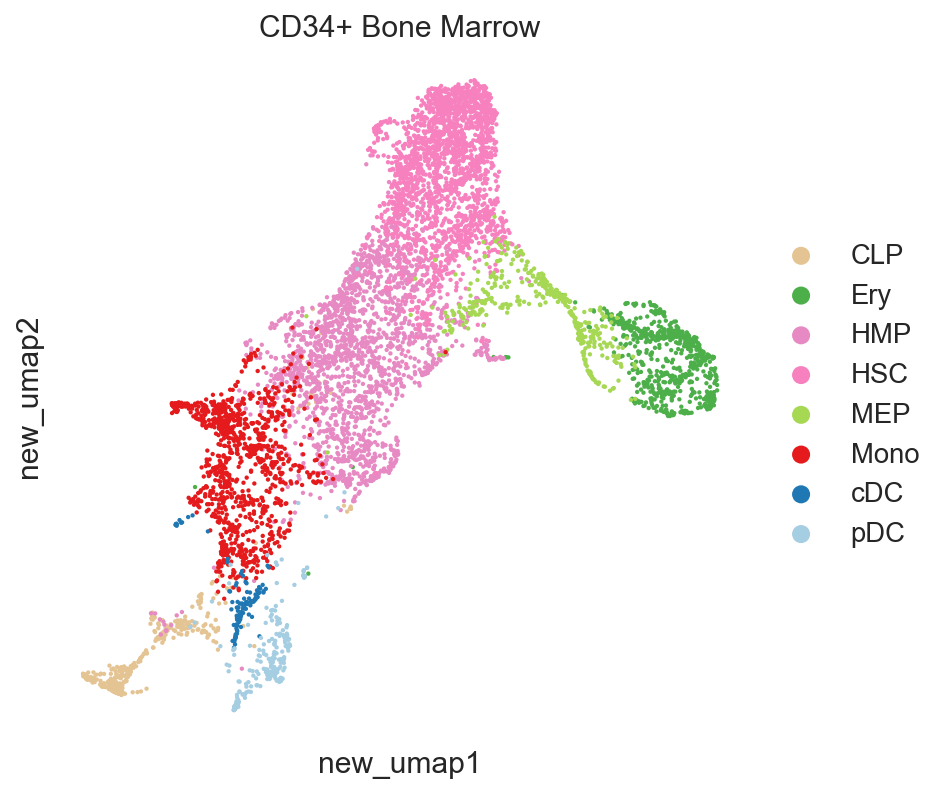

In [14]:
fig, ax = plt.subplots(
    1, 1, facecolor="none", figsize=(6, 6), dpi=150, gridspec_kw={"wspace": 0.5}
)
sc.pl.scatter(ad_cd34, basis="new_umap", color=["celltype"], ax=ax, show=False)
ax.title.set_text("CD34+ Bone Marrow")
plt.show()

In [15]:
from scipy.stats import gaussian_kde

ad_cd34.obs["umap_density"] = gaussian_kde(ad_cd34.obsm["X_umap"].T)(
    ad_cd34.obsm["X_umap"].T
)
ad_cd34.obs["new_umap_density"] = gaussian_kde(ad_cd34.obsm["X_new_umap"].T)(
    ad_cd34.obsm["X_new_umap"].T
)

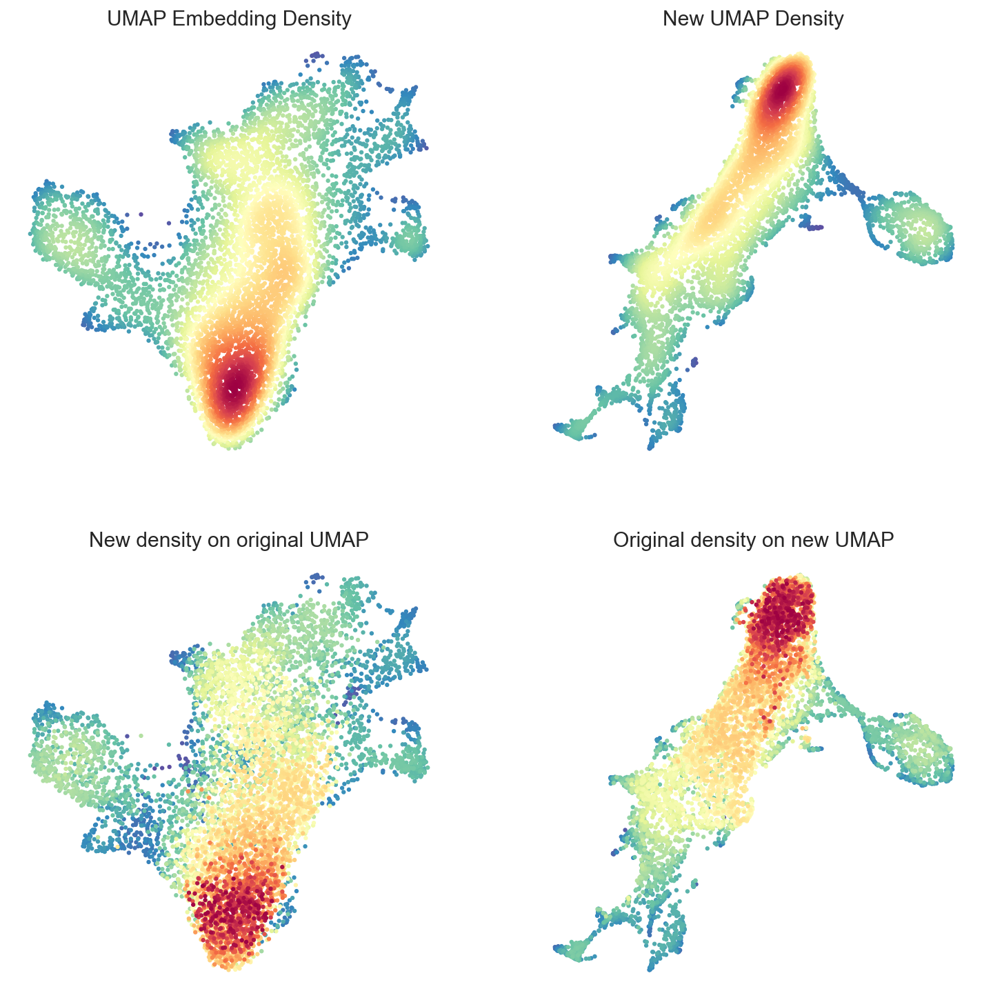

In [16]:
fig, ax = plt.subplots(2, 2, facecolor="none", figsize=(12, 12), dpi=150)
ax = ax.ravel()

i = np.argsort(ad_cd34.obs["umap_density"].values)
ax[0].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["umap_density"][i],
    s=5,
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("UMAP Embedding Density")

ax[3].scatter(
    ad_cd34.obsm["X_new_umap"][i, 0],
    ad_cd34.obsm["X_new_umap"][i, 1],
    c=ad_cd34.obs["umap_density"][i],
    s=5,
)
ax[3].set_xticks([])
ax[3].set_yticks([])
ax[3].title.set_text("Original density on new UMAP")


i = np.argsort(ad_cd34.obs["new_umap_density"].values)
ax[1].scatter(
    ad_cd34.obsm["X_new_umap"][i, 0],
    ad_cd34.obsm["X_new_umap"][i, 1],
    c=ad_cd34.obs["new_umap_density"][i],
    s=5,
)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].title.set_text("New UMAP Density")

ax[2].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["new_umap_density"][i],
    s=5,
)
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].title.set_text("New density on original UMAP")
plt.show()

2-d embedding based density values on shown on UMAP and [Harmony Force Directed Layout (FDL)](https://github.com/dpeerlab/Harmony).

## T-Cell Depleted Bone Marrow

In [17]:
ad_tcell.obsm["X_original_umap"] = ad_tcell.obsm["X_umap"]
sc.tl.umap(ad_tcell, min_dist=1, spread=10)
ad_tcell.obsm["X_new_umap"] = ad_tcell.obsm["X_umap"]
ad_tcell.obsm["X_umap"] = ad_tcell.obsm["X_original_umap"]

/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


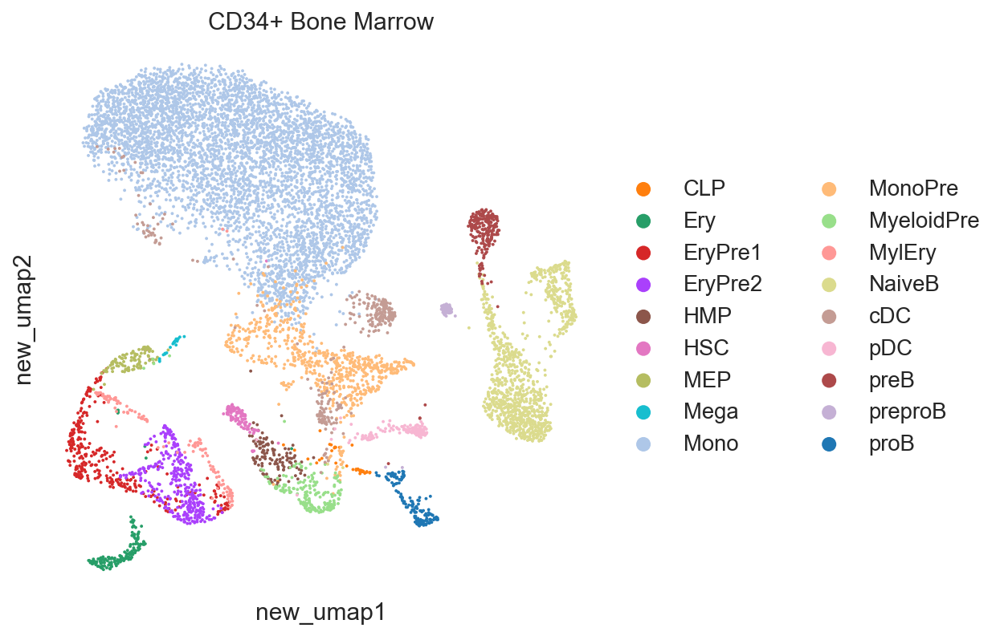

In [19]:
fig, ax = plt.subplots(
    1, 1, facecolor="none", figsize=(6, 6), dpi=150, gridspec_kw={"wspace": 0.5}
)
sc.pl.scatter(
    ad_tcell, basis="new_umap", color=["celltype"], ax=ax, show=False
)
ax.title.set_text("CD34+ Bone Marrow")
plt.show()

In [20]:
from scipy.stats import gaussian_kde

ad_tcell.obs["umap_density"] = gaussian_kde(ad_tcell.obsm["X_umap"].T)(
    ad_tcell.obsm["X_umap"].T
)
ad_tcell.obs["new_umap_density"] = gaussian_kde(ad_tcell.obsm["X_new_umap"].T)(
    ad_tcell.obsm["X_new_umap"].T
)

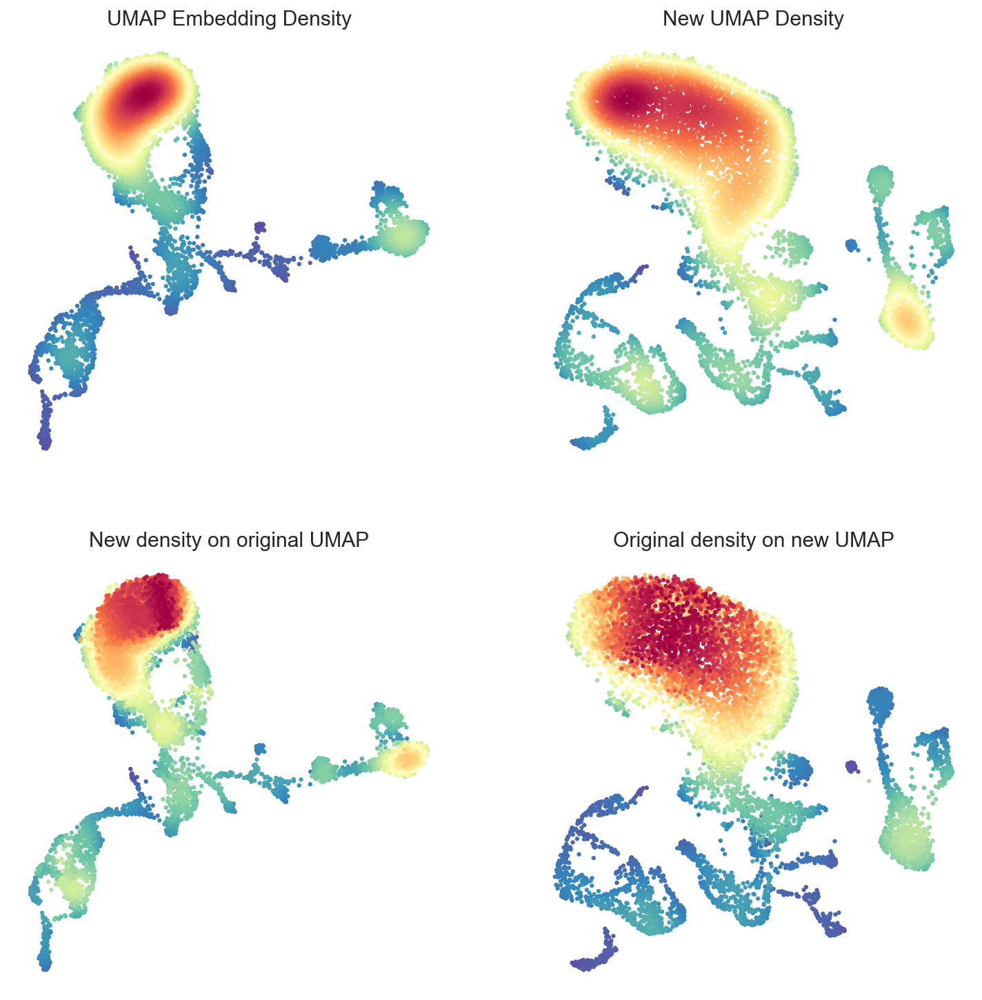

In [21]:
fig, ax = plt.subplots(2, 2, facecolor="none", figsize=(12, 12), dpi=150)
ax = ax.ravel()

i = np.argsort(ad_tcell.obs["umap_density"].values)
ax[0].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["umap_density"][i],
    s=5,
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("UMAP Embedding Density")

ax[3].scatter(
    ad_tcell.obsm["X_new_umap"][i, 0],
    ad_tcell.obsm["X_new_umap"][i, 1],
    c=ad_tcell.obs["umap_density"][i],
    s=5,
)
ax[3].set_xticks([])
ax[3].set_yticks([])
ax[3].title.set_text("Original density on new UMAP")


i = np.argsort(ad_tcell.obs["new_umap_density"].values)
ax[1].scatter(
    ad_tcell.obsm["X_new_umap"][i, 0],
    ad_tcell.obsm["X_new_umap"][i, 1],
    c=ad_tcell.obs["new_umap_density"][i],
    s=5,
)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].title.set_text("New UMAP Density")

ax[2].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["new_umap_density"][i],
    s=5,
)
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].title.set_text("New density on original UMAP")
plt.show()

2-d embedding based density values on shown on different UMAPs.

# Supplementary Figure Temp2

## CD34+ Bone Marrow

/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/jax/_src/numpy/lax_numpy.py:3492: UserWarning: 'kind' argument to argsort is ignored; only 'stable' sorts are supported.
  warnings.warn("'kind' argument to argsort is ignored; only 'stable' sorts "


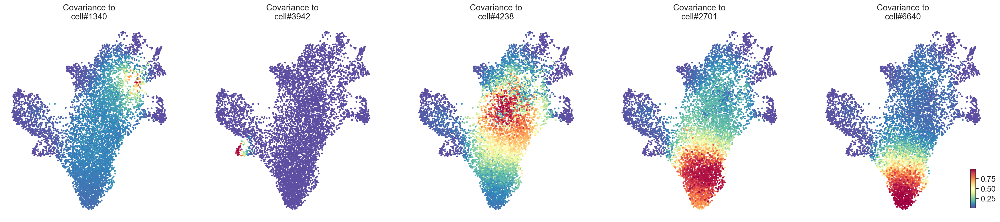

In [22]:
n = 5

cell_idx = np.argmin(
    np.abs(
        ad_cd34.obs["log_density_quantile"].values[None, :]
        - np.linspace(0.03, 1, n)[:, None]
    ),
    axis=1,
)
X = ad_cd34.obsm["DM_EigenVectors"]
fig, axs = plt.subplots(1, n, facecolor="none", figsize=(6 * n, 6), dpi=150)
for cell, ax in zip(cell_idx, axs.ravel()):
    covs = est_cd34.cov_func(X[cell, None, :], X)[0, :]
    i = np.argsort(covs)
    cb = ax.scatter(
        ad_cd34.obsm["X_umap"][i, 0],
        ad_cd34.obsm["X_umap"][i, 1],
        c=covs[i],
        s=5,
    )
    ax.set_xticks([])
    ax.set_yticks([])
    ax.title.set_text(f"Covariance to\ncell#{cell}")
cax = ax.inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)
plt.show()

## T-Cell Depleted Bone Marrow

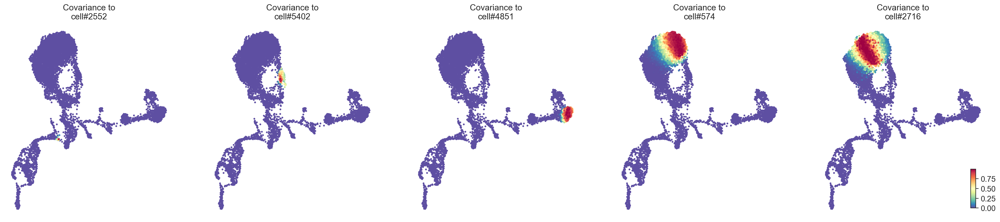

In [23]:
n = 5

cell_idx = np.argmin(
    np.abs(
        ad_tcell.obs["log_density_quantile"].values[None, :]
        - np.linspace(0.03, 1, n)[:, None]
    ),
    axis=1,
)
X = ad_tcell.obsm["DM_EigenVectors"]
fig, axs = plt.subplots(1, n, facecolor="none", figsize=(6 * n, 6), dpi=150)
for cell, ax in zip(cell_idx, axs.ravel()):
    covs = est_tcell.cov_func(X[cell, None, :], X)[0, :]
    i = np.argsort(covs)
    cb = ax.scatter(
        ad_tcell.obsm["X_umap"][i, 0],
        ad_tcell.obsm["X_umap"][i, 1],
        c=covs[i],
        s=5,
    )
    ax.set_xticks([])
    ax.set_yticks([])
    ax.title.set_text(f"Covariance to\ncell#{cell}")
cax = ax.inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)
plt.show()

Connection of the density estimation of 5 selected cells with the density estimation of their neighbors in terms of the Covarianciance of the Gaussian Process.

# Supplementary Figure Temp6

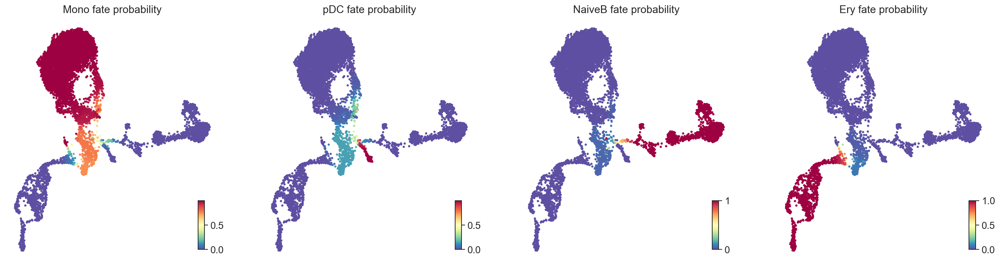

In [24]:
n_fates = ad_tcell.obsm["palantir_branch_probs"].shape[1]
fig, axs = plt.subplots(1, n_fates, facecolor="none", figsize=(6 * n_fates, 6), dpi=150)
for ax, (fate, probs) in zip(axs, ad_tcell.obsm["palantir_branch_probs"].items()):
    i = np.argsort(probs)
    cb = ax.scatter(
        ad_tcell.obsm["X_umap"][i, 0],
        ad_tcell.obsm["X_umap"][i, 1],
        c=probs[i],
        s=5,
    )
    ax.set_xticks([])
    ax.set_yticks([])
    ax.title.set_text(f"{fate} fate probability")
    cax = ax.inset_axes([0.9, 0.05, 0.03, 0.2])
    cbar = fig.colorbar(cb, cax=cax)
plt.show()

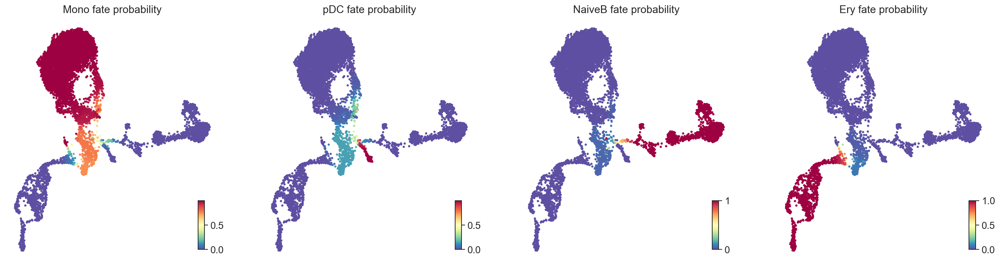

In [26]:
mod_fates = ad_tcell.obsm["palantir_branch_probs"].copy()
n_fates = mod_fates.shape[1]
fig, axs = plt.subplots(1, n_fates, facecolor="none", figsize=(6 * n_fates, 6), dpi=150)
for ax, (fate, probs) in zip(axs, mod_fates.items()):
    i = np.argsort(probs)
    cb = ax.scatter(
        ad_tcell.obsm["X_umap"][i, 0],
        ad_tcell.obsm["X_umap"][i, 1],
        c=probs[i],
        s=5,
    )
    ax.set_xticks([])
    ax.set_yticks([])
    ax.title.set_text(f"{fate} fate probability")
    cax = ax.inset_axes([0.9, 0.05, 0.03, 0.2])
    cbar = fig.colorbar(cb, cax=cax)
plt.show()

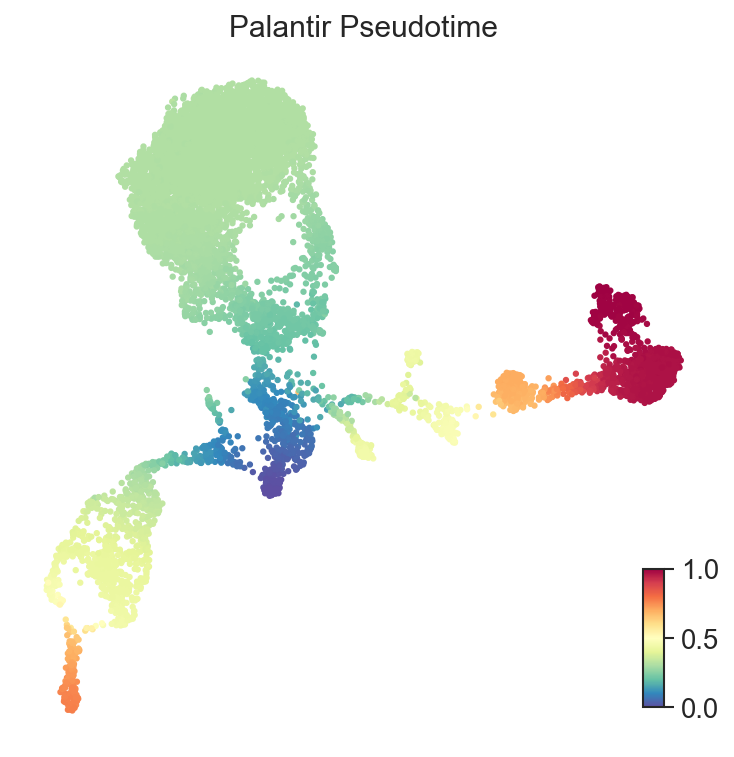

In [27]:
fig, ax = plt.subplots(1, 1, facecolor="none", figsize=(6, 6), dpi=150)
cb = ax.scatter(
    ad_tcell.obsm["X_umap"][:, 0],
    ad_tcell.obsm["X_umap"][:, 1],
    c=ad_tcell.obs["palantir_pseudotime"],
    s=5,
)
ax.set_xticks([])
ax.set_yticks([])
ax.title.set_text(f"Palantir Pseudotime")
cax = ax.inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)
plt.show()

Cell-fate probabilities in T-cell depleted bone marrow.

# Supplementary Figure Temp48

MAP vs. ADVI.

In [28]:
est_tcell_advi = mellon.DensityEstimator(optimizer="advi")
ad_tcell.obs["log_density_advi"] = est_tcell_advi.fit_predict(
    ad_tcell.obsm["DM_EigenVectors"]
)
ad_tcell.obs["log_density_advi_quantile"] = (
    ad_tcell.obs["log_density_advi"].rank() / ad_tcell.n_obs
)

est_cd34_advi = mellon.DensityEstimator(optimizer="advi")
ad_cd34.obs["log_density_advi"] = est_cd34_advi.fit_predict(
    ad_cd34.obsm["DM_EigenVectors"]
)
ad_cd34.obs["log_density_advi_quantile"] = (
    ad_cd34.obs["log_density"].rank() / ad_cd34.n_obs
)

[2023-06-22 21:17:17,260] [INFO    ] Computing nearest neighbor distances.
[2023-06-22 21:17:17,995] [INFO    ] Using covariance function Matern52(ls=0.006271295878809611).
[2023-06-22 21:17:17,999] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-22 21:17:20,395] [INFO    ] Doing low-rank Cholesky decomposition for 8,627 samples and 5,000 landmarks.
[2023-06-22 21:17:24,177] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-22 21:17:25,168] [INFO    ] Running inference using advi.
[2023-06-22 21:17:38,860] [INFO    ] Computing nearest neighbor distances.
[2023-06-22 21:17:38,909] [INFO    ] Using covariance function Matern52(ls=0.016795660090567287).
[2023-06-22 21:17:38,911] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-22 21:17:41,535] [INFO    ] Doing low-rank Cholesky decomposition for 6,881 samples and 5,000 landmarks.
[2023-06-22 21:17:45,242] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-22 21:17:46,

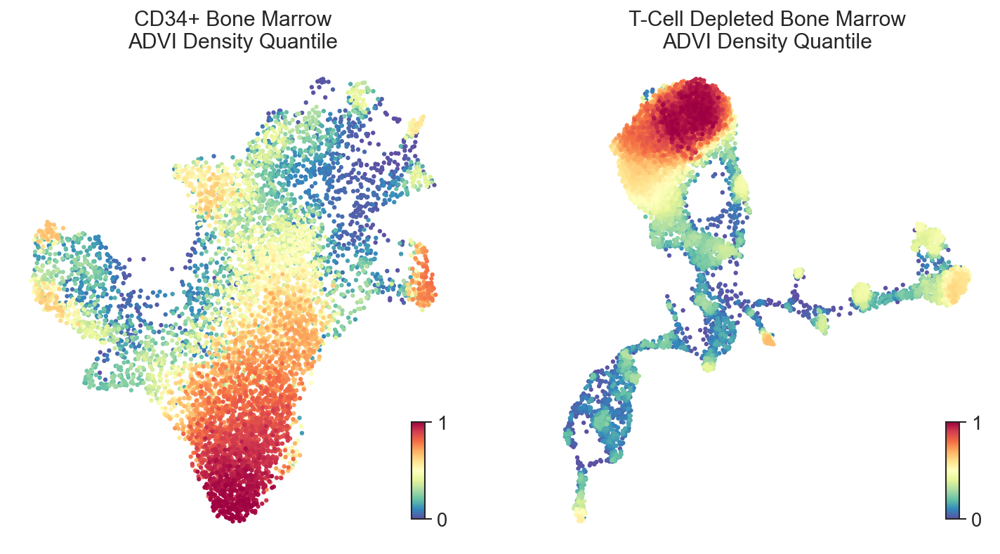

In [29]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
i = np.argsort(ad_cd34.obs["log_density_advi_quantile"])
cb = ax[0].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["log_density_advi_quantile"][i],
    s=5,
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("CD34+ Bone Marrow\nADVI Density Quantile")
cax = ax[0].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax, ticks=[1e-3, 1])
cbar.ax.set_yticklabels([0, 1])

i = np.argsort(ad_tcell.obs["log_density_advi_quantile"])
cb = ax[1].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["log_density_advi_quantile"][i],
    s=5,
)
ax[1].title.set_text("T-Cell Depleted Bone Marrow\nADVI Density Quantile")
ax[1].set_xticks([])
ax[1].set_yticks([])
cax = ax[1].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax, ticks=[1e-3, 1])
cbar.ax.set_yticklabels([0, 1])
plt.show()

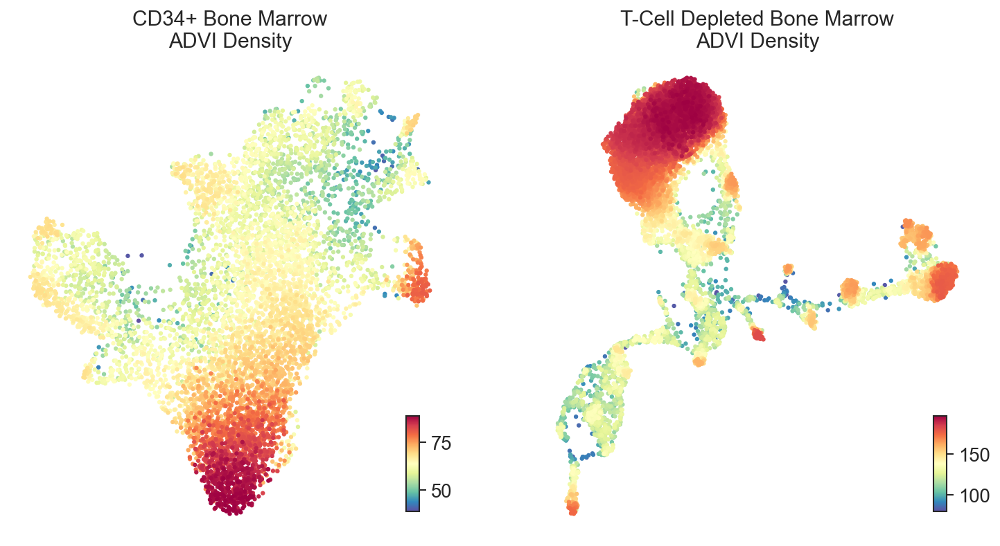

In [30]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
i = np.argsort(ad_cd34.obs["log_density_advi"])
cb = ax[0].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["log_density_advi"][i],
    s=5,
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("CD34+ Bone Marrow\nADVI Density")
cax = ax[0].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)

i = np.argsort(ad_tcell.obs["log_density_advi"])
cb = ax[1].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["log_density_advi"][i],
    s=5,
)
ax[1].title.set_text("T-Cell Depleted Bone Marrow\nADVI Density")
ax[1].set_xticks([])
ax[1].set_yticks([])
cax = ax[1].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)
plt.show()

In [31]:
est_tcell_adam = mellon.DensityEstimator(optimizer="adam")
ad_tcell.obs["log_density_adam"] = est_tcell_adam.fit_predict(
    ad_tcell.obsm["DM_EigenVectors"]
)
ad_tcell.obs["log_density_adam_quantile"] = (
    ad_tcell.obs["log_density_adam"].rank() / ad_tcell.n_obs
)

est_cd34_adam = mellon.DensityEstimator(optimizer="adam")
ad_cd34.obs["log_density_adam"] = est_cd34_adam.fit_predict(
    ad_cd34.obsm["DM_EigenVectors"]
)
ad_cd34.obs["log_density_adam_quantile"] = (
    ad_cd34.obs["log_density"].rank() / ad_cd34.n_obs
)

[2023-06-22 21:17:56,532] [INFO    ] Computing nearest neighbor distances.
[2023-06-22 21:17:57,331] [INFO    ] Using covariance function Matern52(ls=0.006271295878809611).
[2023-06-22 21:17:57,335] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-22 21:17:59,699] [INFO    ] Doing low-rank Cholesky decomposition for 8,627 samples and 5,000 landmarks.
[2023-06-22 21:18:03,616] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-22 21:18:04,642] [INFO    ] Running inference using adam.
[2023-06-22 21:18:11,508] [INFO    ] Computing nearest neighbor distances.
[2023-06-22 21:18:11,548] [INFO    ] Using covariance function Matern52(ls=0.016795660090567287).
[2023-06-22 21:18:11,550] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-22 21:18:13,813] [INFO    ] Doing low-rank Cholesky decomposition for 6,881 samples and 5,000 landmarks.
[2023-06-22 21:18:17,265] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-22 21:18:18,

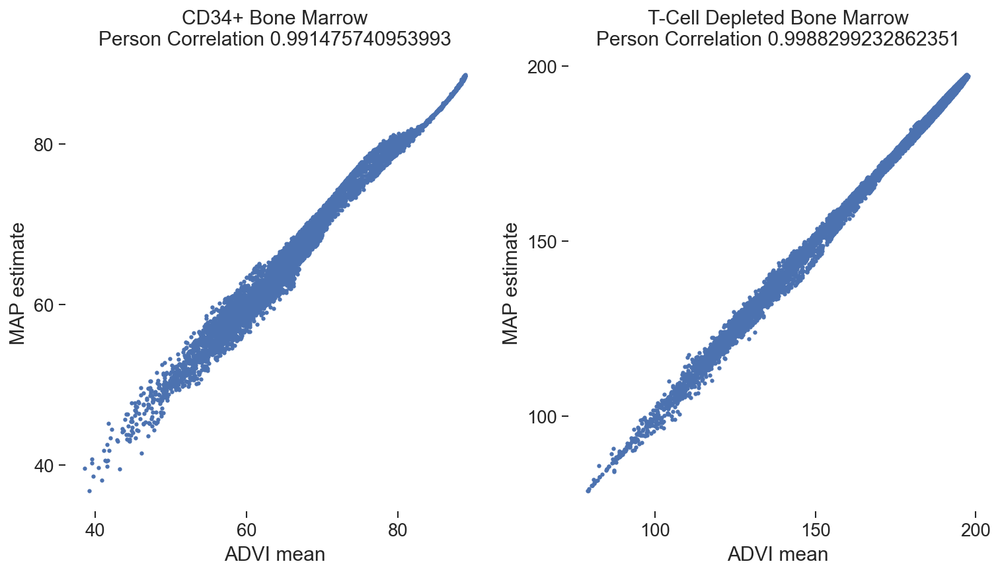

In [32]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
plt.locator_params(axis="x", nbins=3)
plt.locator_params(axis="y", nbins=3)

ax[0].scatter(
    x=ad_cd34.obs["log_density_advi"],
    y=ad_cd34.obs["log_density_adam"],
    s=5,
)
corr = np.corrcoef(
    ad_cd34.obs["log_density_advi"],
    ad_cd34.obs["log_density_adam"],
)[0, 1]
ax[0].set_xlabel("ADVI mean")
ax[0].set_ylabel("MAP estimate")
ax[0].locator_params(axis="x", nbins=3)
ax[0].locator_params(axis="y", nbins=3)
ax[0].title.set_text(f"CD34+ Bone Marrow\nPerson Correlation {corr}")

ax[1].scatter(
    x=ad_tcell.obs["log_density_advi"],
    y=ad_tcell.obs["log_density_adam"],
    s=5,
)
corr = np.corrcoef(
    ad_tcell.obs["log_density_advi"],
    ad_tcell.obs["log_density_adam"],
)[0, 1]
ax[1].set_xlabel("ADVI mean")
ax[1].set_ylabel("MAP estimate")
ax[1].locator_params(axis="x", nbins=3)
ax[1].locator_params(axis="y", nbins=3)
ax[1].title.set_text(f"T-Cell Depleted Bone Marrow\nPerson Correlation {corr}")
plt.show()

In [33]:
pre_transforms = np.random.normal(
    est_tcell_advi.pre_transformation,
    np.exp(est_tcell_advi.pre_transformation_std),
    (1000, est_tcell_advi.pre_transformation.shape[0]),
)
denss = est_tcell_advi.transform(pre_transforms.T)
ad_tcell.obs["uncertainty"] = denss.std(axis=1)
ad_tcell.obs["mean_log_density"] = denss.mean(axis=1)

pre_transforms = np.random.normal(
    est_cd34_advi.pre_transformation,
    np.exp(est_cd34_advi.pre_transformation_std),
    (1000, est_cd34_advi.pre_transformation.shape[0]),
)
denss = est_cd34_advi.transform(pre_transforms.T)
ad_cd34.obs["uncertainty"] = denss.std(axis=1)
ad_cd34.obs["mean_log_density"] = denss.mean(axis=1)

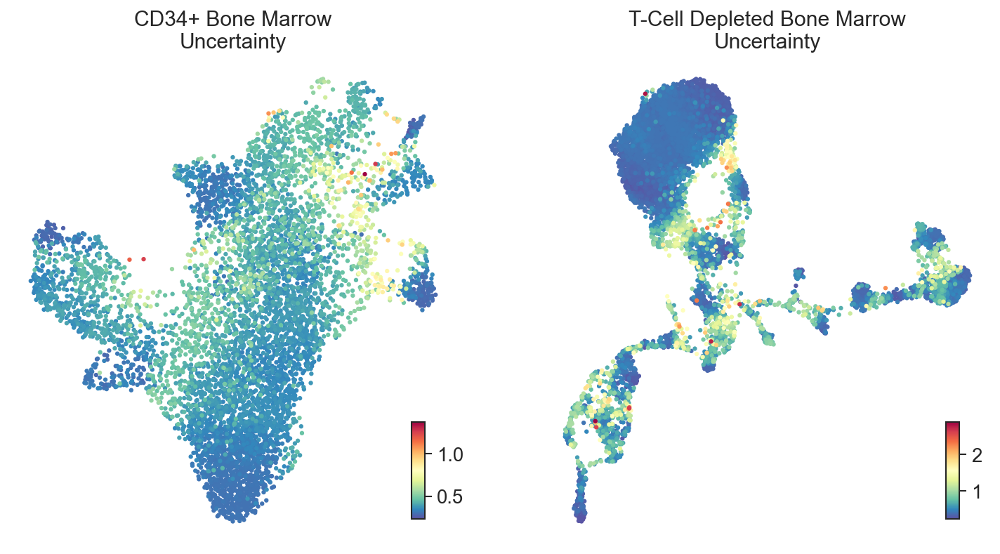

In [34]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
i = np.argsort(ad_cd34.obs["uncertainty"])
cb = ax[0].scatter(
    ad_cd34.obsm["X_umap"][i, 0],
    ad_cd34.obsm["X_umap"][i, 1],
    c=ad_cd34.obs["uncertainty"][i],
    s=5,
)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].title.set_text("CD34+ Bone Marrow\nUncertainty")
cax = ax[0].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)

i = np.argsort(ad_tcell.obs["uncertainty"])
cb = ax[1].scatter(
    ad_tcell.obsm["X_umap"][i, 0],
    ad_tcell.obsm["X_umap"][i, 1],
    c=ad_tcell.obs["uncertainty"][i],
    s=5,
)
ax[1].title.set_text("T-Cell Depleted Bone Marrow\nUncertainty")
ax[1].set_xticks([])
ax[1].set_yticks([])
cax = ax[1].inset_axes([0.9, 0.05, 0.03, 0.2])
cbar = fig.colorbar(cb, cax=cax)
plt.show()

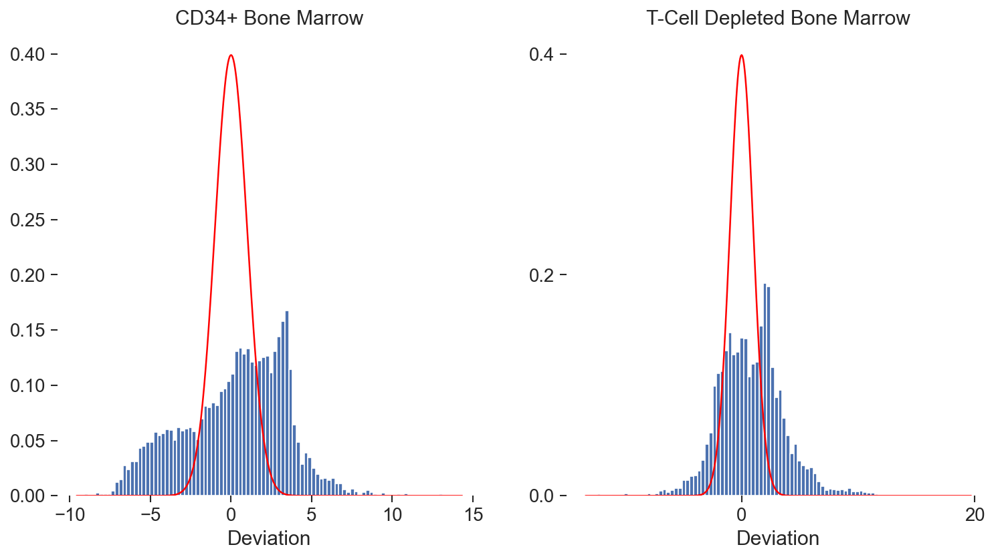

In [35]:
fig, ax = plt.subplots(1, 2, facecolor="none", figsize=(12, 6), dpi=150)
plt.locator_params(axis="x", nbins=3)
plt.locator_params(axis="y", nbins=3)

zscore = (
    ad_cd34.obs["log_density_advi"] - ad_cd34.obs["log_density_adam"]
) / ad_cd34.obs["uncertainty"]
ax[0].hist(zscore, bins=100, density=True)

grid = np.linspace(*np.quantile(zscore, [0, 1]), 500)
ax[0].plot(grid, norm.pdf(grid), color="red")
ax[0].set_xlabel("Deviation")
ax[0].title.set_text(f"CD34+ Bone Marrow")

zscore = (
    ad_tcell.obs["log_density_advi"] - ad_tcell.obs["log_density_adam"]
) / ad_tcell.obs["uncertainty"]
ax[1].hist(zscore, bins=100, density=True)
grid = np.linspace(*np.quantile(zscore, [0, 1]), 500)
ax[1].plot(grid, norm.pdf(grid), color="red")
ax[1].set_xlabel("Deviation")
ax[1].title.set_text(f"T-Cell Depleted Bone Marrow")
plt.show()

In [36]:
import pwd
user_info = pwd.getpwuid(os.getuid())
author = user_info.pw_gecos
email = user_info.pw_name + "@fredhutch.org"
%load_ext watermark
%watermark -a "{author}" -e {email} -h -v -iv -m -u -w -i

Author: Dominik Otto, S2-106, x4475,umask=0007, Setty Lab,

Email: dotto@fredhutch.org

Last updated: 2023-06-22T21:23:00.025046-07:00

Python implementation: CPython
Python version       : 3.10.10
IPython version      : 8.13.2

Compiler    : GCC 11.3.0
OS          : Linux
Release     : 4.15.0-192-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 36
Architecture: 64bit

Hostname: gizmok125

scanpy    : 1.9.3
pandas    : 1.5.3
matplotlib: 3.7.1
numpy     : 1.24.3
mellon    : 1.3.0
palantir  : 1.2

Watermark: 2.3.1

